In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        (os.path.join(dirname, filename))
print("Done")
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Done


## Semantic Segmentation on (UAVs) Drone Dataset


In [ ]:
!pip install timm --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.2 MB/s eta 0:00:00:00:0100:01


In [ ]:


import os
import numpy as np
from glob import glob
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import timm
import matplotlib.pyplot as plt
import tqdm

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms


In [ ]:

# os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

DATA_DIR = '/kaggle/input/uav-segmentation-aeroscapes/aeroscapes'
NUM_CLASSES = 11
IMG_SIZE = 518

## Custom class for dataset
class AeroScapesDataset(Dataset):
    def __init__(self, root_dir, split='train'):
        self.img_dir = os.path.join(root_dir, 'JPEGImages')
        self.mask_dir = os.path.join(root_dir, 'SegmentationClass')
        split_map = {'train': 'trn.txt', 'val': 'val.txt'}
        split_file = os.path.join(root_dir, 'ImageSets', split_map[split])
        with open(split_file) as f:
            self.file_names = [line.strip() for line in f.readlines()]

        self.img_transform = transforms.Compose([
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
        self.mask_transform = transforms.Resize((IMG_SIZE, IMG_SIZE), interpolation=Image.NEAREST)

    def __len__(self):
        return len(self.file_names)

    def __getitem__(self, idx):
        name = self.file_names[idx]
        img = Image.open(os.path.join(self.img_dir, name + '.jpg')).convert('RGB')
        mask = Image.open(os.path.join(self.mask_dir, name + '.png'))
        img = self.img_transform(img)
        mask = self.mask_transform(mask)
        mask = torch.from_numpy(np.array(mask)).long()
        mask = torch.clamp(mask, min=0, max=NUM_CLASSES - 1)  # Clamp to valid range
        return img, mask

In [ ]:

### U-Net + Dino

class UNet(nn.Module):
    def __init__(self, backbone_name='vit_base_patch14_dinov2', num_classes=NUM_CLASSES):
        super().__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=True, features_only=True)
        for param in self.backbone.parameters():
            param.requires_grad = False
        # Decoder conv layer
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(768, 512, kernel_size=2, stride=2),  # 37 - 74
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.up2 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),  # 74 - 148
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.up3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),  # 148 - 296
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.up4 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),   # 296 - 592
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        features = self.backbone(x)[-1]  ## l fmap

        x = self.up1(features)  # (B, 512, 74, 74)
        x = self.up2(x)         # (B, 256, 148, 148)
        x = self.up3(x)         # (B, 128, 296, 296)
        x = self.up4(x)         # (B, 64, 592, 592)
        x = center_crop(x, 512, 512)
        out = self.final_conv(x)  # (B, num_classes, 512, 512)
        return out

def center_crop(tensor, target_h, target_w):
    _, _, h, w = tensor.shape
    start_h = (h - target_h) // 2
    start_w = (w - target_w) // 2
    return tensor[:, :, start_h:start_h+target_h, start_w:start_w+target_w]


In [ ]:
def compute_mIoU(pred, target, num_classes):
    pred = pred.argmax(dim=1)
    ious = []
    for cls in range(num_classes):
        pred_inds = (pred == cls)
        target_inds = (target == cls)
        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()
        if union == 0:
            ious.append(float('nan'))
        else:
            ious.append(intersection / union)
    return np.nanmean(ious)

def compute_pixel_accuracy(pred, target):
    pred = pred.argmax(dim=1)
    correct = (pred == target).sum().item()
    total = torch.numel(target)
    return correct / total


In [ ]:

def train():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = UNet(num_classes=NUM_CLASSES).to(device)
    train_dataset = AeroScapesDataset(DATA_DIR, split='train')
    val_dataset = AeroScapesDataset(DATA_DIR, split='val')
    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=2)

    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    criterion = nn.CrossEntropyLoss()

    for epoch in range(1, 12):
        model.train()
        total_loss = 0
        for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch}"):
            imgs, masks = imgs.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            masks_cropped = masks[:, :outputs.shape[2], :outputs.shape[3]]
            loss = criterion(outputs, masks_cropped)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        print(f"\n📉 Epoch {epoch} - Train Loss: {total_loss / len(train_loader):.4f}")

        model.eval()
        with torch.no_grad():
            total_iou = 0
            total_pixel_acc = 0
            count = 0
            for imgs, masks in val_loader:
                imgs, masks = imgs.to(device), masks.to(device)
                outputs = model(imgs)
                masks_cropped = masks[:, :outputs.shape[2], :outputs.shape[3]]

                miou = compute_mIoU(outputs, masks_cropped, NUM_CLASSES)
                pixel_acc = compute_pixel_accuracy(outputs, masks_cropped)

                total_iou += miou
                total_pixel_acc += pixel_acc
                count += 1

            print(f"🎯 Epoch {epoch} - Val mIoU: {total_iou / count:.4f} | Pixel Acc: {total_pixel_acc / count:.4f}")

    torch.save(model.state_dict(), 'unet_dino_aeroscapes_version_2.pth')
    print("✅ Model saved to disk!")

## Testing input and output dim
try:
    test_model = UNet(num_classes=NUM_CLASSES).to("cuda")
    dummy = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to("cuda")
    with torch.no_grad():
        out = test_model(dummy)
    print("Output shape:", out.shape)
except Exception as e:
    print("Failed:", e)

train()


✅ Sanity check passed. Output shape: torch.Size([1, 11, 512, 512])


Epoch 1: 100%|██████████| 656/656 [04:22<00:00,  2.50it/s]



📉 Epoch 1 - Train Loss: 1.1374
🎯 Epoch 1 - Val mIoU: 0.1990 | Pixel Acc: 0.6408


Epoch 2: 100%|██████████| 656/656 [04:22<00:00,  2.50it/s]



📉 Epoch 2 - Train Loss: 0.4045
🎯 Epoch 2 - Val mIoU: 0.3220 | Pixel Acc: 0.8590


Epoch 4: 100%|██████████| 656/656 [04:23<00:00,  2.49it/s]



📉 Epoch 4 - Train Loss: 0.2148
🎯 Epoch 4 - Val mIoU: 0.3540 | Pixel Acc: 0.8802


Epoch 5: 100%|██████████| 656/656 [04:23<00:00,  2.49it/s]



📉 Epoch 5 - Train Loss: 0.1906
🎯 Epoch 5 - Val mIoU: 0.3609 | Pixel Acc: 0.8819


Epoch 6: 100%|██████████| 656/656 [04:23<00:00,  2.49it/s]



📉 Epoch 6 - Train Loss: 0.1750
🎯 Epoch 6 - Val mIoU: 0.3627 | Pixel Acc: 0.8837


Epoch 7: 100%|██████████| 656/656 [04:23<00:00,  2.49it/s]



📉 Epoch 7 - Train Loss: 0.1617
🎯 Epoch 7 - Val mIoU: 0.3594 | Pixel Acc: 0.8853


Epoch 8: 100%|██████████| 656/656 [04:22<00:00,  2.49it/s]



📉 Epoch 8 - Train Loss: 0.1523
🎯 Epoch 8 - Val mIoU: 0.3683 | Pixel Acc: 0.8846


Epoch 9: 100%|██████████| 656/656 [04:23<00:00,  2.49it/s]



📉 Epoch 9 - Train Loss: 0.1464
🎯 Epoch 9 - Val mIoU: 0.3618 | Pixel Acc: 0.8870


Epoch 10: 100%|██████████| 656/656 [04:22<00:00,  2.49it/s]



📉 Epoch 10 - Train Loss: 0.1372
🎯 Epoch 10 - Val mIoU: 0.3745 | Pixel Acc: 0.8824


Epoch 11: 100%|██████████| 656/656 [04:23<00:00,  2.49it/s]



📉 Epoch 11 - Train Loss: 0.1329
🎯 Epoch 11 - Val mIoU: 0.3823 | Pixel Acc: 0.8890
✅ Model saved to disk!


In [ ]:

epoch = 10
checkpoint = {
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'num_classes': NUM_CLASSES,
    'backbone': 'vit_base_patch14_dinov2'
}

torch.save(checkpoint, 'unet_dino_full_checkpoint.pth')
print("Checkpoint saved as 'unet_dino_full_checkpoint.pth'")


✅ Full checkpoint saved as 'unet_dino_full_checkpoint.pth'


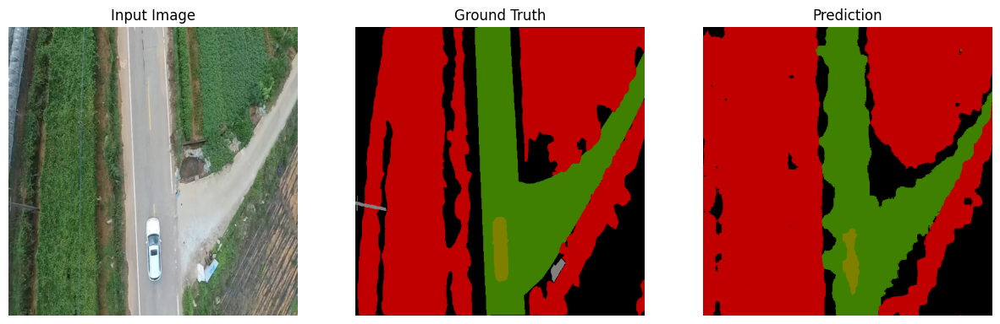

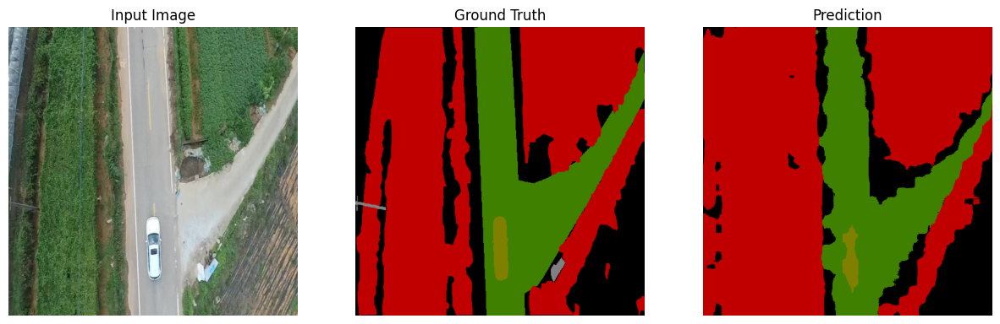

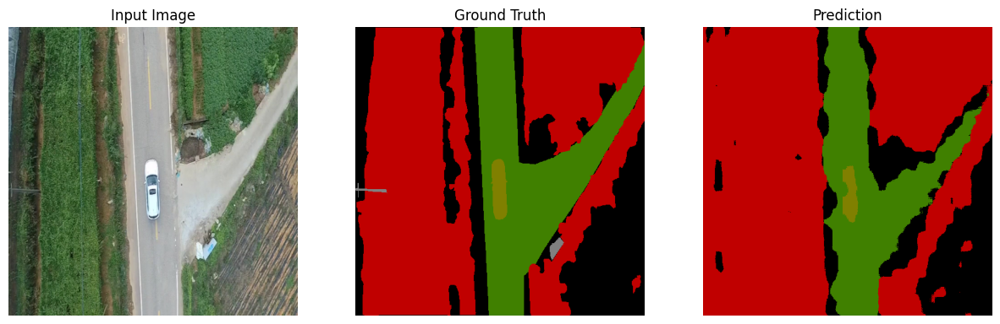

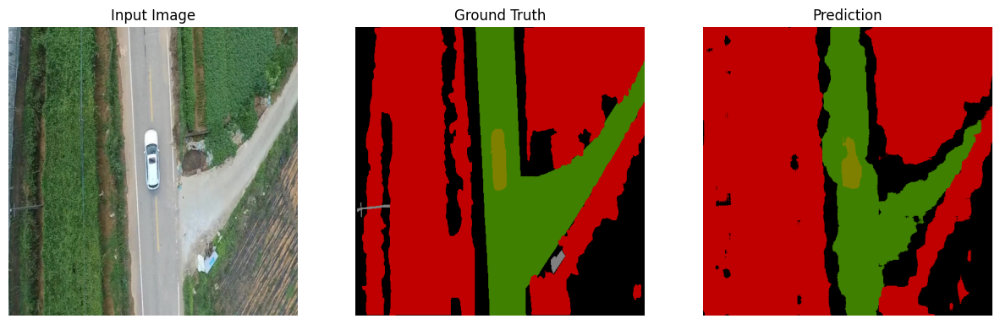

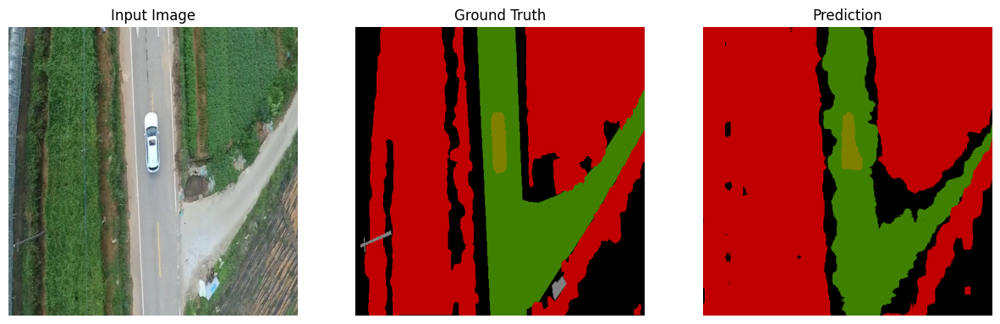

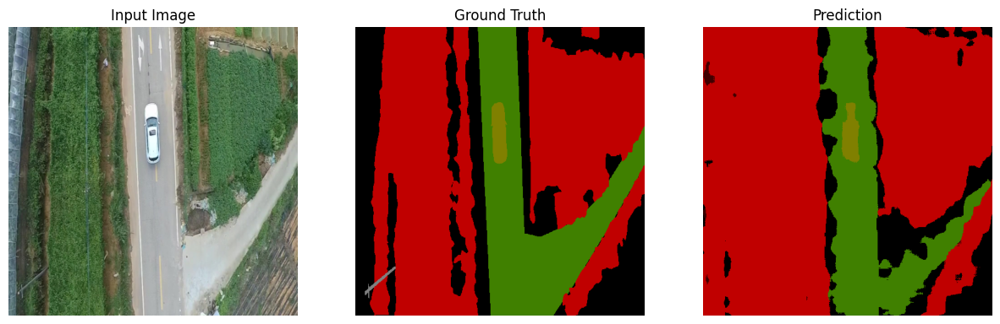

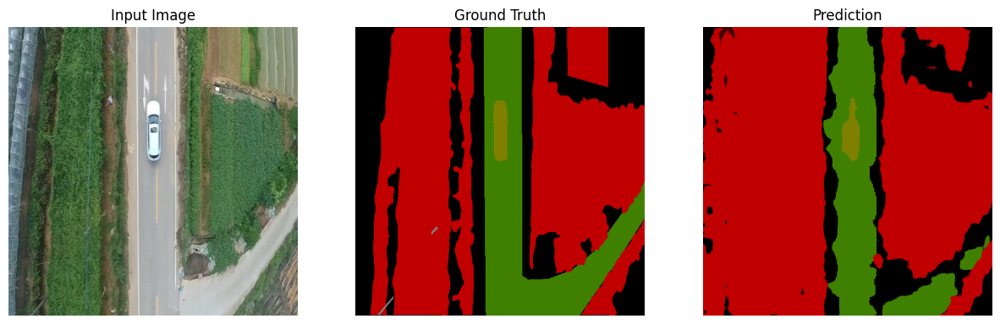

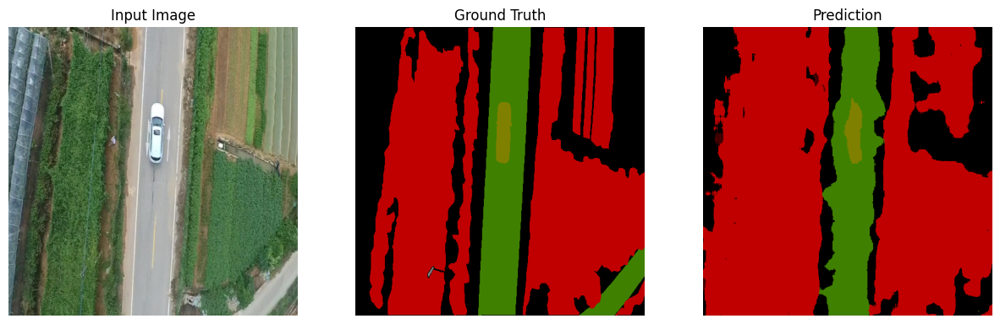

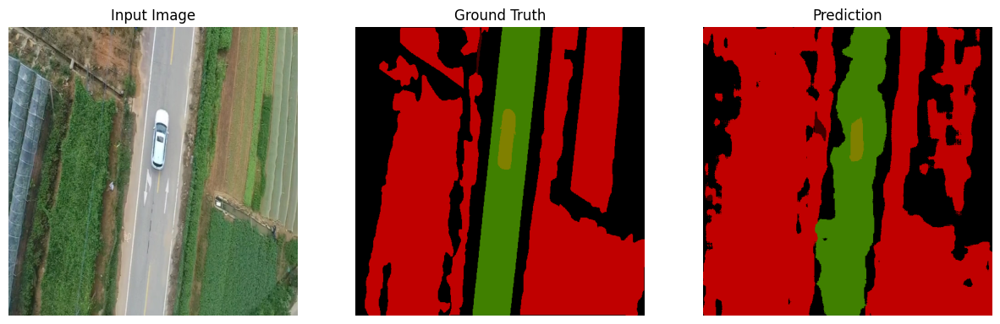

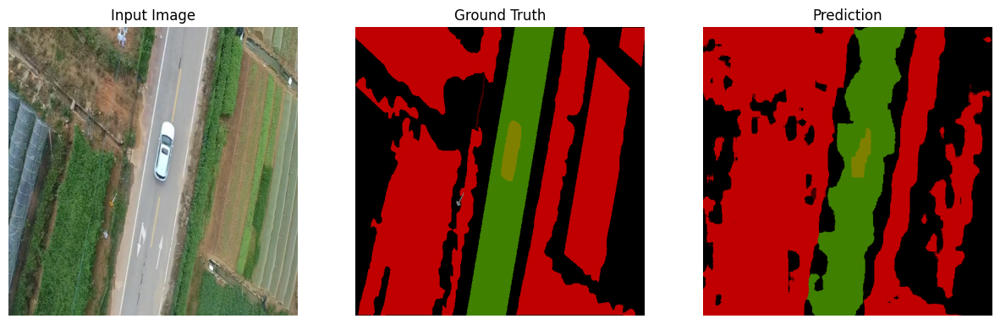

In [ ]:
import matplotlib.pyplot as plt

def load_model():
    model = UNet(num_classes=NUM_CLASSES).to(device)
    model.load_state_dict(torch.load("unet_dino_aeroscapes.pth", map_location=device))
    model.eval()
    return model, device

# Color mapping
def decode_segmap(mask):
    colors = np.array([
        [0, 0, 0], # cl 0
        [128, 0, 0], # cl 1
        [0, 128, 0],
        [128, 128, 0],
        [0, 0, 128],
        [128, 0, 128],
        [0, 128, 128],
        [128, 128, 128],
        [64, 0, 0],
        [192, 0, 0],
        [64, 128, 0],
    ])
    return colors[mask]

def visualize_predictions(model, loader, device, num_samples=10):
    images_shown = 0
    with torch.no_grad():
        for imgs, masks in loader:
            imgs, masks = imgs.to(device), masks.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1)

            for i in range(imgs.size(0)):
                if images_shown >= num_samples:
                    return

                img = imgs[i].cpu().numpy().transpose(1, 2, 0)
                img = (img * 0.5 + 0.5) * 255  # Denormalize
                img = img.astype(np.uint8)

                gt_mask = masks[i].cpu().numpy()
                pred_mask = preds[i].cpu().numpy()

                fig, axs = plt.subplots(1, 3, figsize=(15, 5))
                axs[0].imshow(img)
                axs[0].set_title("Input Image")
                axs[1].imshow(decode_segmap(gt_mask))
                axs[1].set_title("Ground Truth")
                axs[2].imshow(decode_segmap(pred_mask))
                axs[2].set_title("Prediction")
                for ax in axs:
                    ax.axis('off')
                plt.show()

                images_shown += 1

# Run visualization
model, device = load_model()
val_dataset = AeroScapesDataset(DATA_DIR, split='val')
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False)
visualize_predictions(model, val_loader, device, num_samples=10)


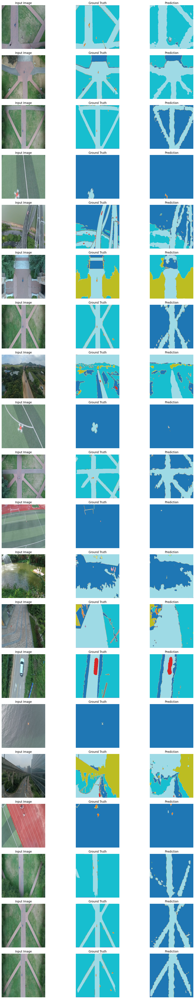

In [ ]:
import matplotlib.pyplot as plt
import random
import torch
import numpy as np

def visualize_predictions(model, dataset, device, num_images=10):
    model.eval()
    indices = random.sample(range(len(dataset)), num_images)
    plt.figure(figsize=(15, num_images * 3))
    for i, idx in enumerate(indices):
        img, mask = dataset[idx]
        input_img = img.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(input_img)
            pred = output.argmax(dim=1).squeeze().cpu().numpy()

        gt_mask = mask.numpy()
        img_disp = img.permute(1, 2, 0).cpu().numpy()
        img_disp = (img_disp * 0.5) + 0.5  # inverse norm.
        img_disp = np.clip(img_disp, 0, 1)

        plt.subplot(num_images, 3, 3*i + 1)
        plt.imshow(img_disp)
        plt.title('Input Image')
        plt.axis('off')

        plt.subplot(num_images, 3, 3*i + 2)
        plt.imshow(gt_mask, cmap='tab20')
        plt.title('Ground Truth')
        plt.axis('off')

        plt.subplot(num_images, 3, 3*i + 3)
        plt.imshow(pred, cmap='tab20')
        plt.title('Prediction')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_predictions(model, val_dataset, device, num_images=20)


In [ ]:
print("Hello")

Hello


Image 1 feature map shape: torch.Size([768, 37, 37])


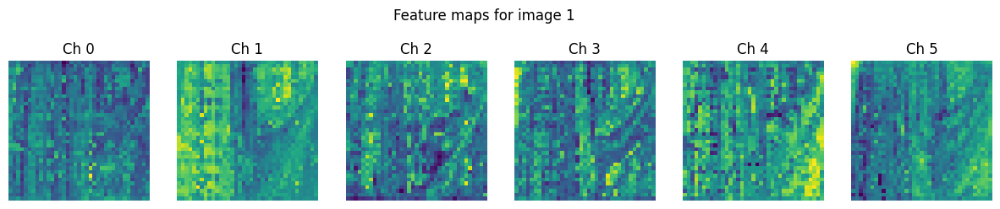

Image 2 feature map shape: torch.Size([768, 37, 37])


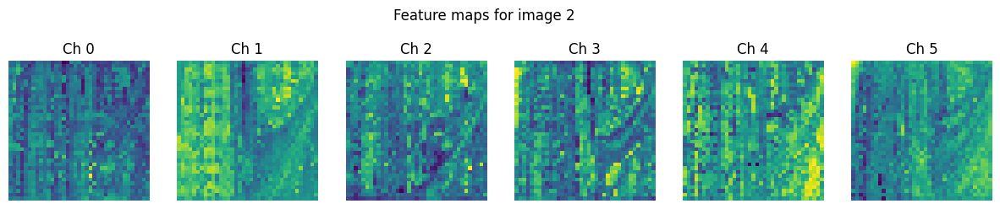

Image 3 feature map shape: torch.Size([768, 37, 37])


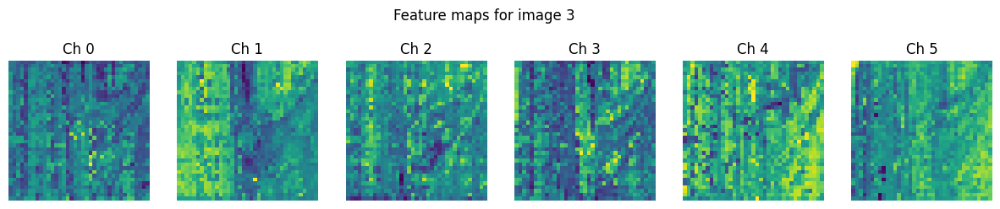

In [ ]:
import matplotlib.pyplot as plt
import torch
import timm

# Load your dataset
dataset = AeroScapesDataset(DATA_DIR, split='val')

# Create the DINO backbone (frozen weights)
backbone = timm.create_model('vit_base_patch14_dinov2', pretrained=True, features_only=True)
backbone.eval()

# Select first 3 images from the dataset
imgs = [dataset[i][0].unsqueeze(0) for i in range(3)]  # Add batch dim

with torch.no_grad():
    for i, img in enumerate(imgs):
        features = backbone(img)[-1]  # last feature map, shape [1, 768, 37, 37]
        features = features.squeeze(0)  # remove batch dim => [768, 37, 37]

        print(f"Image {i+1} feature map shape: {features.shape}")

        # Plot first 6 channels of the feature map
        fig, axes = plt.subplots(1, 6, figsize=(15, 3))
        for ch in range(6):
            ax = axes[ch]
            ax.imshow(features[ch].cpu(), cmap='viridis')
            ax.axis('off')
            ax.set_title(f'Ch {ch}')
        plt.suptitle(f'Feature maps for image {i+1}')
        plt.show()


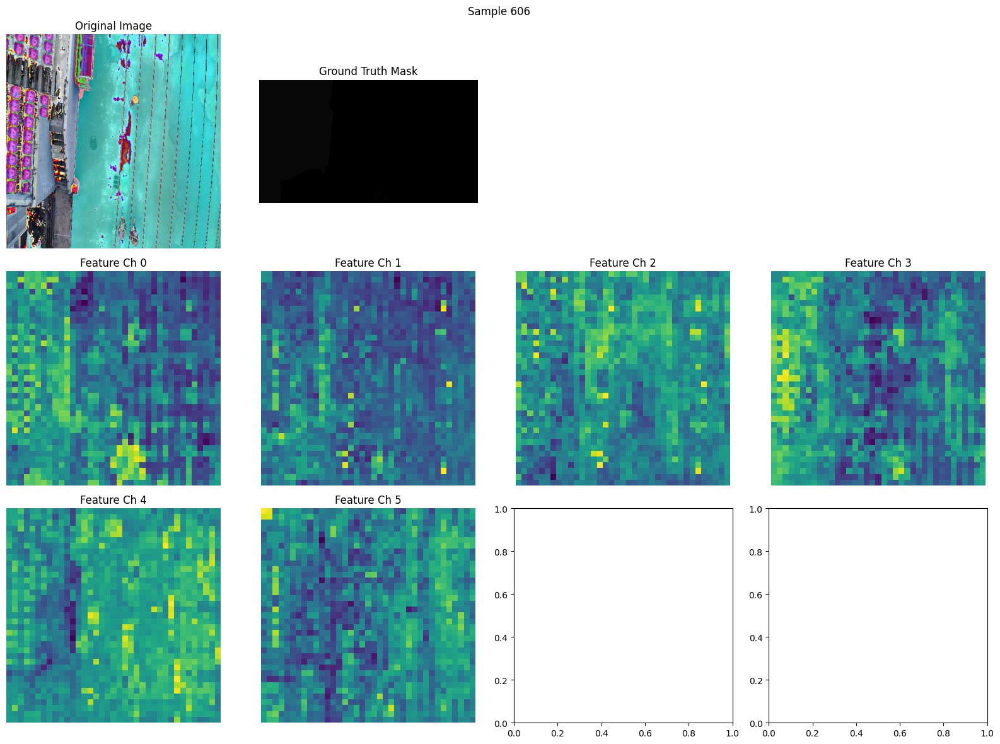

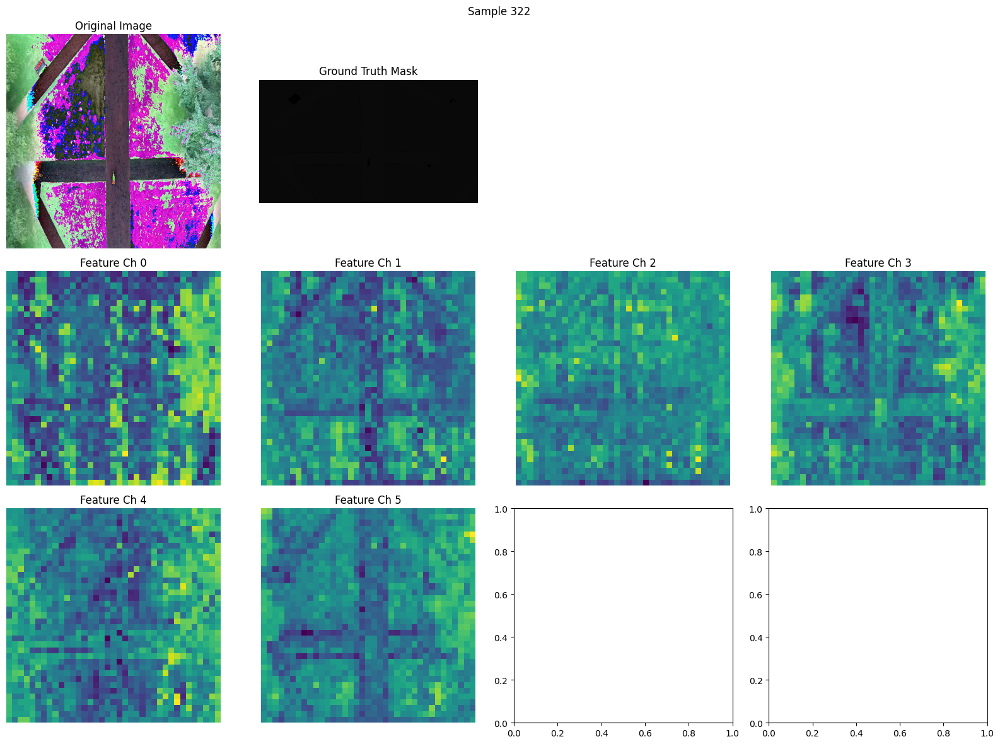

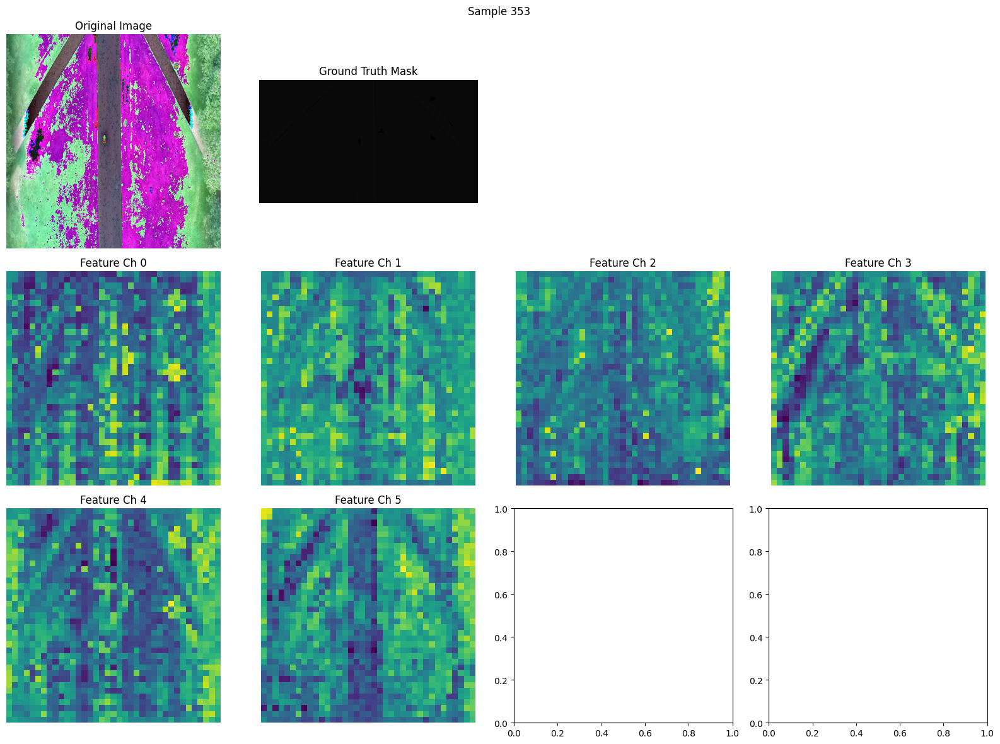

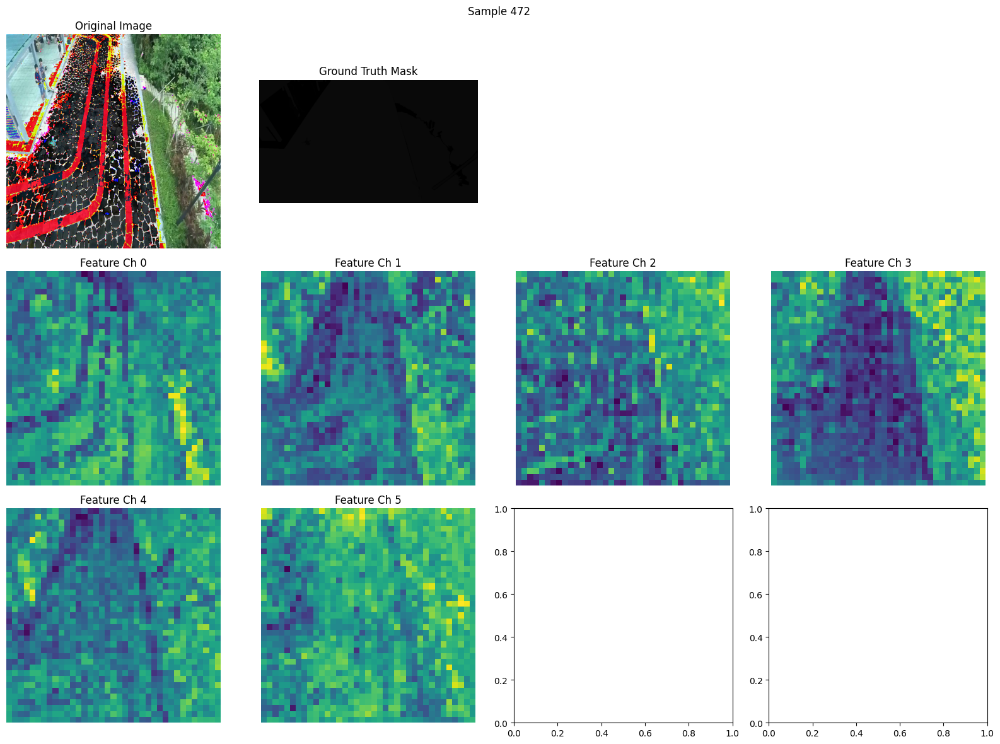

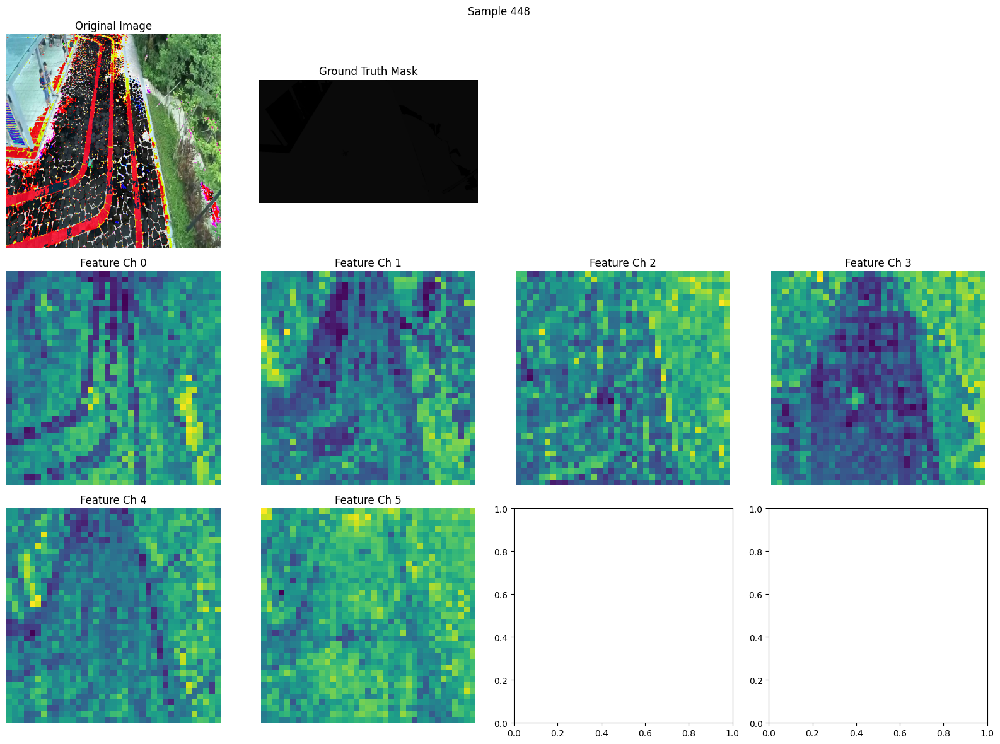

In [ ]:
import matplotlib.pyplot as plt
import torch
import timm
import numpy as np
from torchvision.transforms.functional import to_pil_image
import random
import os
from PIL import Image

# Load dataset and backbone
dataset = AeroScapesDataset(DATA_DIR, split='val')
backbone = timm.create_model('vit_base_patch14_dinov2', pretrained=True, features_only=True)
backbone.eval()

# Pick 5 random images
indices = random.sample(range(len(dataset)), 5)

with torch.no_grad():
    for i in indices:
        img, mask = dataset[i]
        img_batch = img.unsqueeze(0)  # add batch dim
        features = backbone(img_batch)[-1].squeeze(0)  # [768, 37, 37]

        img_show = to_pil_image(img)
        mask_show = Image.open(os.path.join(DATA_DIR, 'SegmentationClass', dataset.file_names[i] + '.png')).convert('RGB')
        fig, axes = plt.subplots(3, 4, figsize=(16, 12))  # 3 rows, 4 cols

        axes[0, 0].imshow(img_show)
        axes[0, 0].set_title("Original Image")
        axes[0, 0].axis('off')
        axes[0, 1].imshow(mask_show)
        axes[0, 1].set_title("Ground Truth Mask")
        axes[0, 1].axis('off')

        for ch in range(6):
            row = (ch // 4) + 1  # Start from row 1 (2nd row)
            col = ch % 4
            axes[row, col].imshow(features[ch].cpu(), cmap='viridis')
            axes[row, col].set_title(f'Feature Ch {ch}')
            axes[row, col].axis('off')

        # Hide any remaining empty subplots
        for r in range(3):
            for c in range(4):
                if (r == 0 and c <= 1) or (r >= 1 and c < 6):
                    continue
                axes[r, c].axis('off')

        plt.suptitle(f'Sample {i}')
        plt.tight_layout()
        plt.show()


In [1]:
print('hello')

hello
